In [ ]:
# 1. https://github.com/huggingface/diffusers
# 일단 기본이 되는 diffuser가 설치하고
# 관련 부분에 대해서 되는지 체크

# 2. 그 여러가지 중에서...
# 그 안에 있는 https://github.com/huggingface/diffusers/tree/main/examples/instruct_pix2pix

# 참고 : orgin
# https://github.com/timothybrooks/instruct-pix2pix

# L4정도에서도 가능은 해보임
# 일단 기존 batch 정도에서는 18G 정도
# GPU를 사용을 하기에...


## 환경설정

In [ ]:
# !pip install torch==2.5.0 # torch 버전 확인.
# !pip install --upgrade diffusers[torch]
# !pip install --upgrade diffusers[flax]
# !pip install --upgrade diffusers transformers

!pip install diffusers[torch]
!pip install diffusers[flax]
!pip install --upgrade diffusers transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 117.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 85.6 MB/s eta 0:00:00
  Attempting uninstall: tokenizers
    Found existing installation: tokenizers 0.19.1
    Uninstalling tokenizers-0.19.1:
      Successfully uninstalled tokenizers-0.19.1
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.30.3
    Uninstalling diffusers-0.30.3:
      Successfully uninstalled diffusers-0.30.3
  Attempting uninstall: transformers
    Found existing installation: transformers 4.44.2
    Uninstalling transformers-4.44.2:
      Successfully uninstalled transformers-4.44.2


In [ ]:
# 캐시 비우기
from transformers.utils import move_cache
move_cache()

0it [00:00, ?it/s]

## 모델 다운, 테스트

In [ ]:
from diffusers import DDPMScheduler, UNet2DModel, DiffusionPipeline, StableDiffusionInstructPix2PixPipeline
from PIL import Image, ImageOps
import torch
import requests

In [ ]:
#model_id = "sayakpaul/instruct-pix2pix" # <- replace this
# model_id ="runwayml/stable-diffusion-v1-5" #error
model_id ="timbrooks/instruct-pix2pix" # orgin

pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to("cuda")
generator = torch.Generator("cuda").manual_seed(0)

url = "https://huggingface.co/datasets/sayakpaul/sample-datasets/resolve/main/test_pix2pix_4.png"



model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:

def process_image_with_padding(file_path):
    # 이미지 열기
    image = Image.open(file_path)
    image = ImageOps.exif_transpose(image)  # 방향 정보 보정
    image = image.convert("RGB")            # RGB로 변환

    # 1:1 비율로 여백 추가
    image = ImageOps.pad(image, (512, 512), color=(255, 255, 255))  # 흰색 배경 추가

    return image
image = process_image_with_padding('go000015_KimJungeun.jpg')
image

FileNotFoundError: [Errno 2] No such file or directory: '/content/go000015_KimJungeun.jpg'

In [ ]:

prompt = "Korean instrument Janggu Drum change to Timpani"
num_inference_steps = 30
image_guidance_scale = 1.5
guidance_scale = 10
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image


NameError: name 'image' is not defined

In [ ]:
def download_image(url):
   image = PIL.Image.open(requests.get(url, stream=True).raw)
   image = PIL.ImageOps.exif_transpose(image)
   image = image.convert("RGB")
   return image


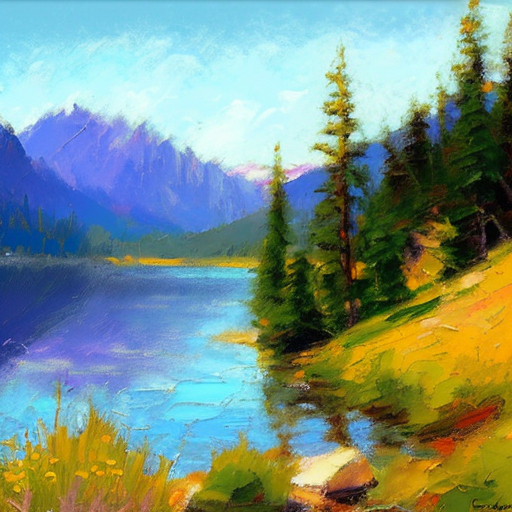

In [ ]:
image = download_image(url)
image

In [ ]:
prompt = "wipe out the lake"
num_inference_steps = 30
image_guidance_scale = 1.5
guidance_scale = 10

  0%|          | 0/30 [00:00<?, ?it/s]

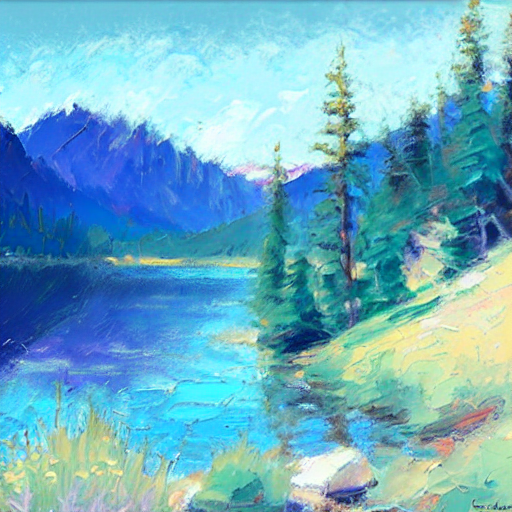

In [ ]:
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

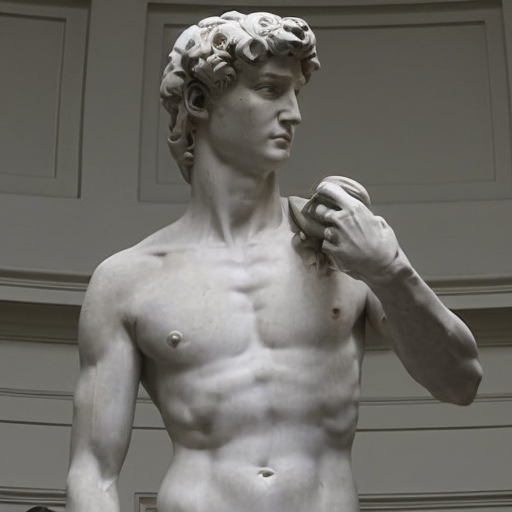

In [ ]:
url = "https://raw.githubusercontent.com/timothybrooks/instruct-pix2pix/main/imgs/example.jpg"
image = download_image(url)
image

  0%|          | 0/30 [00:00<?, ?it/s]

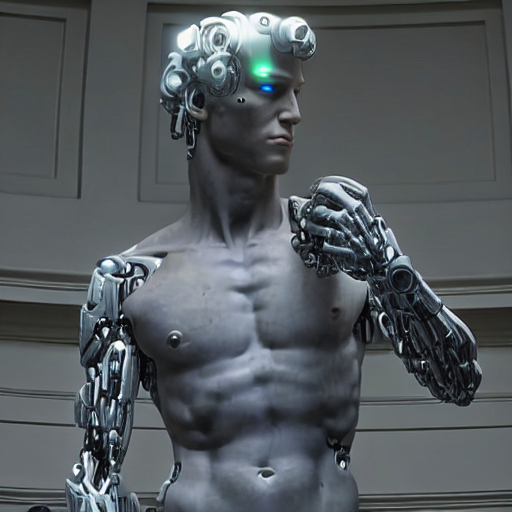

In [ ]:
prompt = "turn him into cyborg"
num_inference_steps = 30
image_guidance_scale = 1.2
guidance_scale = 10
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

In [ ]:
# 형성이 안 될 때의 값을 위해서..
# https://github.com/CompVis/stable-diffusion/issues/239
pipe.safety_checker = None
pipe.requires_safety_checker = False

  0%|          | 0/100 [00:00<?, ?it/s]

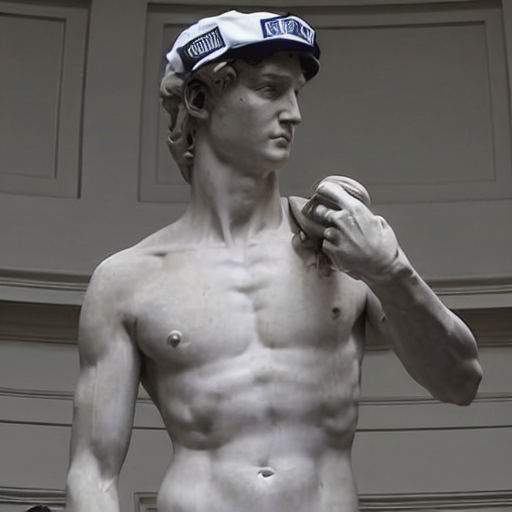

In [ ]:
prompt = "he wear a police cap"
num_inference_steps = 100
image_guidance_scale = 1.2
guidance_scale = 5
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

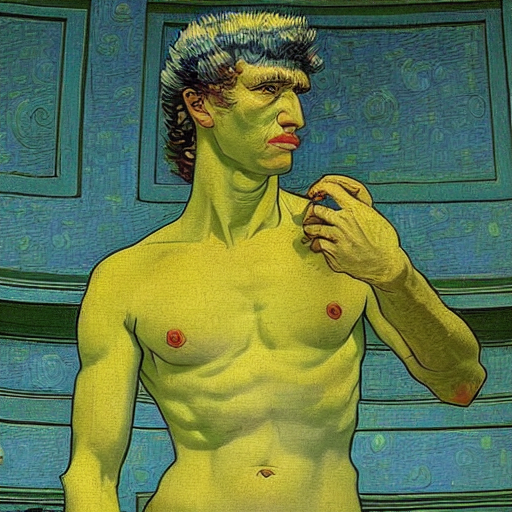

In [ ]:
prompt = "change gogh style"
num_inference_steps = 100
image_guidance_scale = 1.2
guidance_scale = 5
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

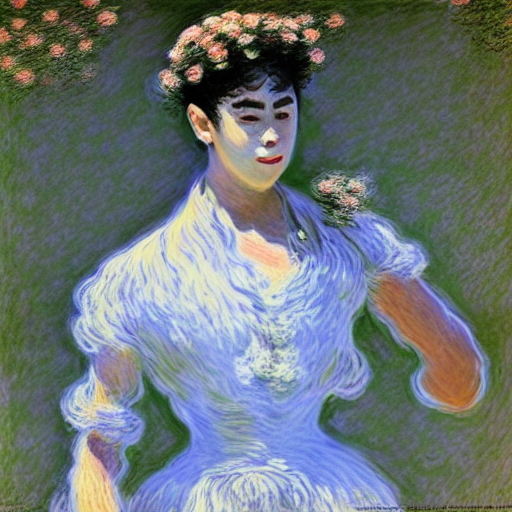

In [ ]:
prompt = "change the Claude Monet style"
num_inference_steps = 100
image_guidance_scale = 1.2
guidance_scale = 5
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
# edited_image.save("edited_image.png")
edited_image

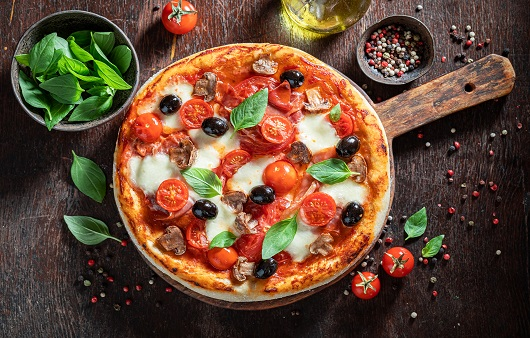

In [ ]:
# Food
url = "https://src.hidoc.co.kr/image/lib/2020/11/9/1604911318873_0.jpg"
image = download_image(url)
image

  0%|          | 0/100 [00:00<?, ?it/s]

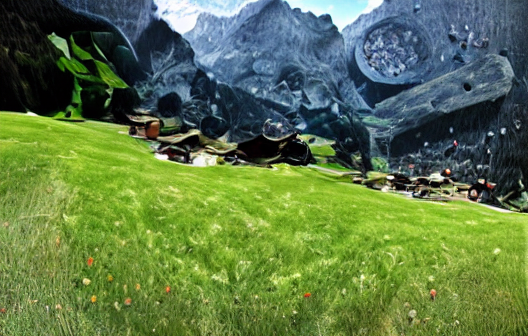

In [ ]:
prompt = "remove on the table"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 15
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

  0%|          | 0/50 [00:00<?, ?it/s]

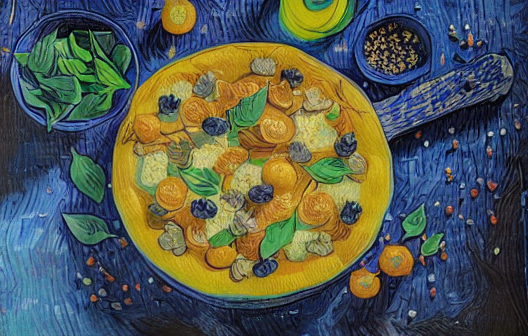

In [ ]:
prompt = "change gogh style"
num_inference_steps = 50
image_guidance_scale = 1.5
guidance_scale = 10
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

## 환경설정, 필요시 터미널과 혼용

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
################
! git clone https://github.com/huggingface/diffusers

Cloning into 'diffusers'...
remote: Enumerating objects: 73809, done.
remote: Counting objects: 100% (12139/12139), done.
remote: Compressing objects: 100% (1394/1394), done.
remote: Total 73809 (delta 11506), reused 10912 (delta 10652), pack-reused 61670 (from 1)
Receiving objects: 100% (73809/73809), 51.58 MiB | 14.30 MiB/s, done.
Resolving deltas: 100% (54810/54810), done.


In [ ]:
# ! huggingface-cli login --token=입력
! huggingface-cli login --token=입력

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: fineGrained).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
%cd /content/diffusers

/content/diffusers


In [ ]:
!pip install -e .

Obtaining file:///content/diffusers
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for diffusers (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.32.0.dev0-0.editable-py3-none-any.whl size=11113 sha256=d88442b266f3011eb0dca65e1502f5337516ba3f42fbd6efcf932128ce0686ac
  Stored in directory: /tmp/pip-ephem-wheel-cache-xxflytdl/wheels/95/c5/3b/e1b4269f8a2584de57e75f949a185b48fc4144e9a91fc9965a
Successfully built diffusers
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.32.0.dev0
    Uninstalling diffusers-0.32.0.dev0:
      Successfully uninstalled diffusers-0.32.0.dev0


In [ ]:
%cd /content/diffusers/examples/instruct_pix2pix

/content/diffusers/examples/instruct_pix2pix


In [ ]:
!pip install -r requirements.txt

  Using cached datasets-3.1.0-py3-none-any.whl.metadata (20 kB)
  Using cached dill-0.3.8-py3-none-any.whl.metadata (10 kB)
  Using cached multiprocess-0.70.16-py310-none-any.whl.metadata (7.2 kB)
Using cached datasets-3.1.0-py3-none-any.whl (480 kB)
Using cached dill-0.3.8-py3-none-any.whl (116 kB)
Using cached multiprocess-0.70.16-py310-none-any.whl (134 kB)


In [ ]:
! python3 -m pip install --no-cache-dir xformers transformers[torch] ftfy datasets tensorboard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 202.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.4/906.4 MB 307.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 312.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 308.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 256.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 337.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 315.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 326.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 300.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 152.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 298.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 298.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
! accelerate config default

accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


In [ ]:
!pip install tensorrt

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for tensorrt: filename=tensorrt-10.6.0-py2.py3-none-any.whl size=16336 sha256=968c8fe804c7477832e83903a51c253b9c37b24779700a862b8e85be1e9f73cc
  Stored in directory: /root/.cache/pip/wheels/2a/97/95/8fdbe17369eed28ee9903523b94e130023ae58edcf1c904e5a
  Created wheel for tensorrt-cu12: filename=tensorrt_cu12-10.6.0-py2.py3-none-any.whl size=17549 sha256=ea0708e09312269ac5d14605aad2882e1c87df4a7ecb46790779d428a91574be
  Stored in directory: /root/.cache/pip/wheels/78/db/ca/0e81d122890b48aaa016992e062a1eb16dc3d00ac546156517
Successfully built tensorrt tensorrt-cu12


## 훈련

In [ ]:
from accelerate.utils import write_basic_config
write_basic_config()
# # from accelerate.utils import write_basic_config
# import os
# #/content/diffusers/examples/instruct_pix2pix/finetune_instruct_pix2pix.py
# # # 설정 파일 경로
# config_path = "/root/.cache/huggingface/accelerate/default_config.yaml"

# # # 기존 설정 파일을 삭제하고 덮어쓰도록
# if os.path.exists(config_path):
#     os.remove(config_path)

# # # 기본 설정 작성
# write_basic_config()


Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.


False

In [ ]:
# sayakpaul/instruct-pix2pix
%cd /content

# finetune 참조:
# https://github.com/WEBAI-IAMAI/TEXT2POKEMON-Instruct-pix2pix/
# https://github.com/huggingface/instruction-tuned-sd

/content


In [ ]:
!apt-get update
!apt-get install curlftpfs
!apt-get install sshfs
!mkdir -p /content/ftp_drive
# 아래 명령어는 쉘에서


# 경로: /content/ftp_drive/logsss



# 훈련후 다음 명령어
# cp -r /content/logsss /content/ftp_drive/

In [ ]:
!cp /content/ftp_drive/forpix2pix/finetune_instruct_pix2pix.py /content/diffusers/examples/instruct_pix2pix/finetune_instruct_pix2pix.py

## 초기모델, 데이터셋 지정, 훈련 시작

In [104]:
# --push_to_hub

import os

os.environ["MODEL_ID"] = "timbrooks/instruct-pix2pix"
os.environ["DATASET_ID"] = "creatoryoon/pix2pix_train_kor_tr"

!accelerate launch --mixed_precision="fp16" \
    /content/diffusers/examples/instruct_pix2pix/finetune_instruct_pix2pix.py \
    --pretrained_model_name_or_path=$MODEL_ID \
    --dataset_name=$DATASET_ID \
    --use_ema \
    --enable_xformers_memory_efficient_attention \
    --resolution=512 --random_flip \
    --original_image_column="input_image" \
    --edit_prompt_column="edit_prompt"\
    --edited_image_column="edited_image"\
    --train_batch_size=2 --gradient_accumulation_steps=4 --gradient_checkpointing \
    --max_train_steps=260 \
    --checkpointing_steps=20 --checkpoints_total_limit=1 \
    --learning_rate=5e-05 --lr_warmup_steps=20 \
    --mixed_precision=fp16 \
    --seed=42 \
    --output_dir=/content/logsss \
    --report_to=wandb





2024-11-06 07:58:19.927143: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-06 07:58:19.949369: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-06 07:58:19.956049: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-06 07:58:21.370189: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(*

## 훈련완료 모델 로드, inference

In [128]:
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline
model_id ="/content/logsss"
#model_id = '/content/logsss/checkpoint-20'

pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16).to("cuda")
generator = torch.Generator("cuda").manual_seed(42)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## 이미지 처리 함수

In [106]:
from PIL import Image, ImageOps

def load_image(file_path):
    image = Image.open(file_path)
    image = ImageOps.exif_transpose(image)
    image = image.convert("RGB")
    return image
def process_image(file_path):
    # 이미지 열기
    image = Image.open(file_path)
    image = ImageOps.exif_transpose(image)  # 방향 정보 보정
    image = image.convert("RGB")            # RGB로 변환

    # 이미지의 중앙을 기준으로 1:1 비율로 자르기
    width, height = image.size
    min_dim = min(width, height)
    left = (width - min_dim) / 2
    top = (height - min_dim) / 2
    right = (width + min_dim) / 2
    bottom = (height + min_dim) / 2
    image = image.crop((left, top, right, bottom))

    # 512x512 크기로 리사이즈
    image = image.resize((512, 512))

    return image
def process_image_with_padding(file_path):
    # 이미지 열기
    image = Image.open(file_path)
    image = ImageOps.exif_transpose(image)  # 방향 정보 보정
    image = image.convert("RGB")            # RGB로 변환

    # 1:1 비율로 여백 추가
    image = ImageOps.pad(image, (512, 512), color=(255, 255, 255))  # 흰색 배경 추가

    return image
def download_image(url):
   image = PIL.Image.open(requests.get(url, stream=True).raw)
   image = PIL.ImageOps.exif_transpose(image)
   image = image.convert("RGB")
   return image

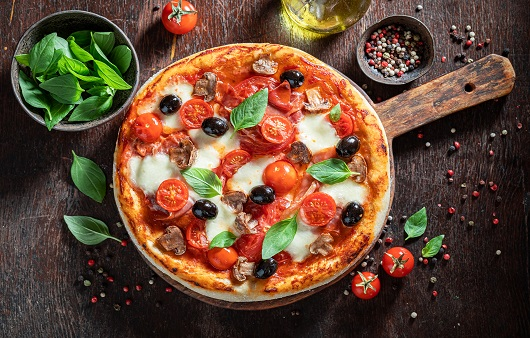

In [107]:
url = "https://src.hidoc.co.kr/image/lib/2020/11/9/1604911318873_0.jpg"
image = download_image(url)
image

  0%|          | 0/50 [00:00<?, ?it/s]

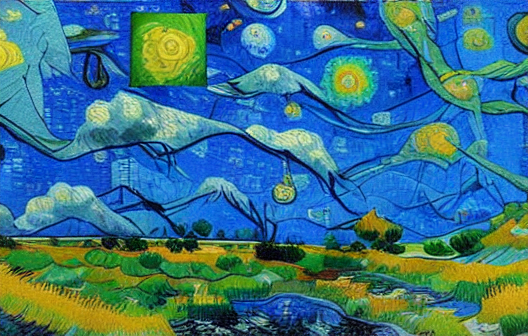

In [108]:
prompt = "change gogh style"
num_inference_steps = 50
image_guidance_scale = 1.5
guidance_scale = 10
edited_image = pipe(prompt, image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image

  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


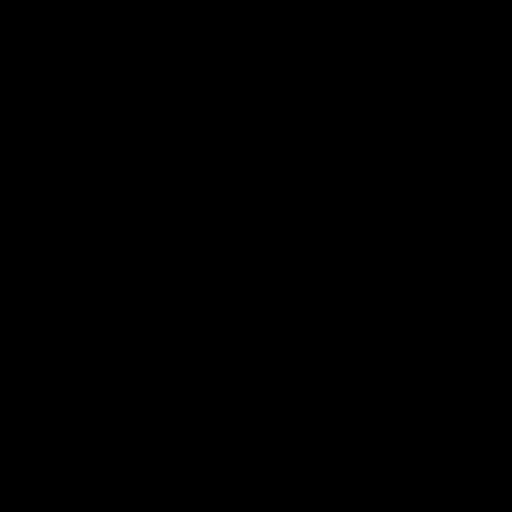

In [ ]:
prompt = "make it an Egyption sculpture"
num_inference_steps = 20
image_guidance_scale = 1.5
guidance_scale = 10

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
# edited_image.save("edited_image.png")
edited_image

In [ ]:
# url = "http://serveryoon.duckdns.org/dataset/DS/%EA%B9%80%EC%A4%80%EA%B7%BC/go000015_KimJungeun.jpg"
# image = download_image(url)
# image = ''

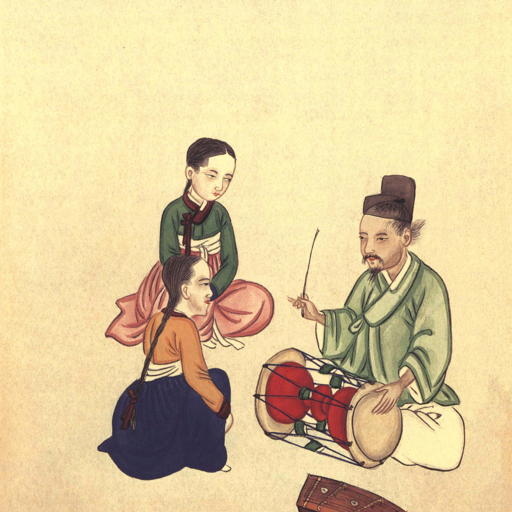

In [129]:
image = process_image('go000015_KimJungeun.jpg')
image

  0%|          | 0/100 [00:00<?, ?it/s]

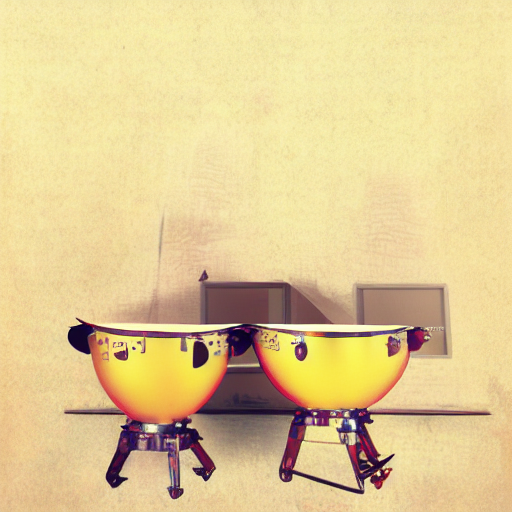

In [131]:
prompt = "Korean instrument Janggu Drum change to Timpani"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

In [90]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


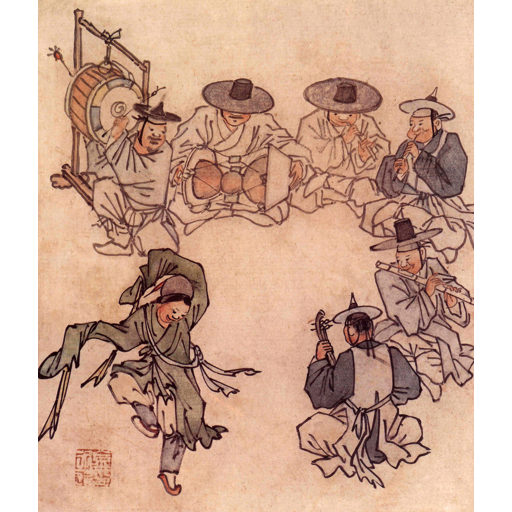

In [134]:
image = process_image_with_padding('/content/go000006.jpg')
image

  0%|          | 0/100 [00:00<?, ?it/s]

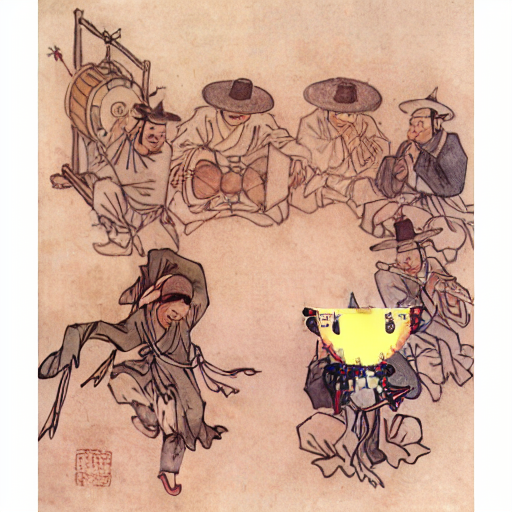

In [135]:
prompt = "Korean instrument Janggu Drum change to Timpani"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 10

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

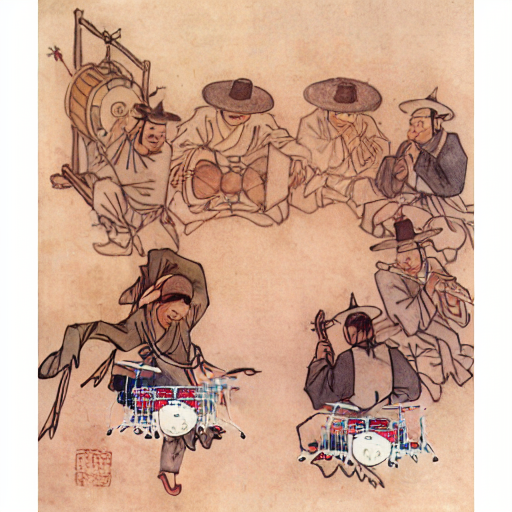

In [136]:
prompt = "Buk change to drum"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 10

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

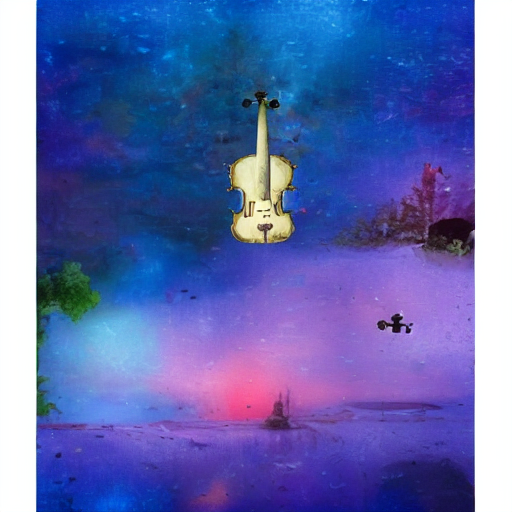

In [137]:
prompt = "change Haegeum Fiddle to Violin"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

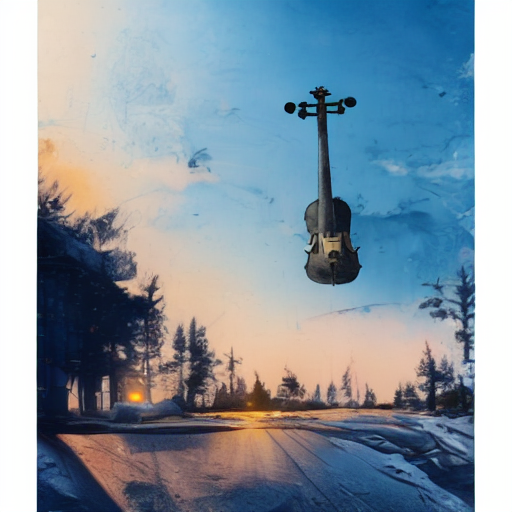

In [138]:
prompt = "change Haegeum to Violin"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

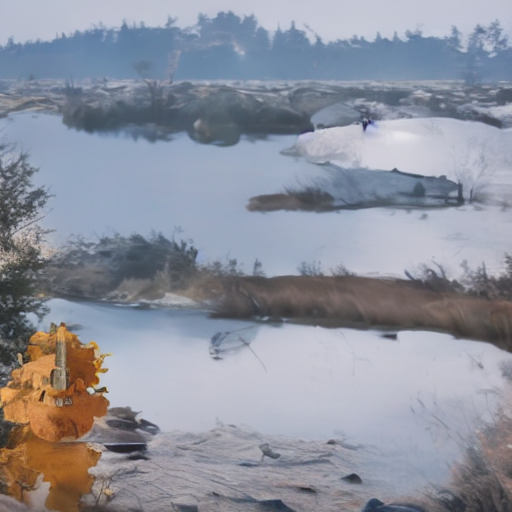

In [116]:
prompt = "Haegeum to Violin"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

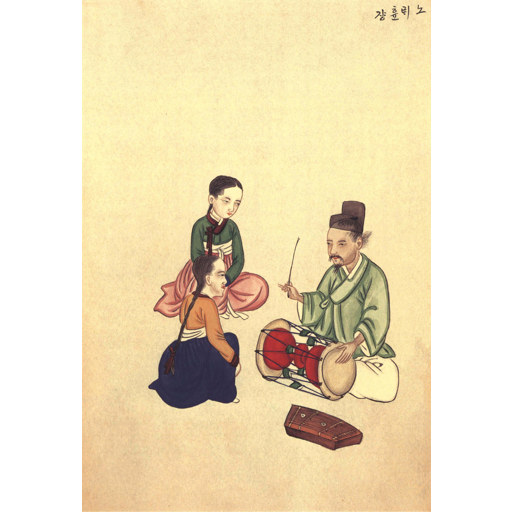

In [150]:
image = process_image_with_padding('go000015_KimJungeun.jpg')
image

  0%|          | 0/100 [00:00<?, ?it/s]

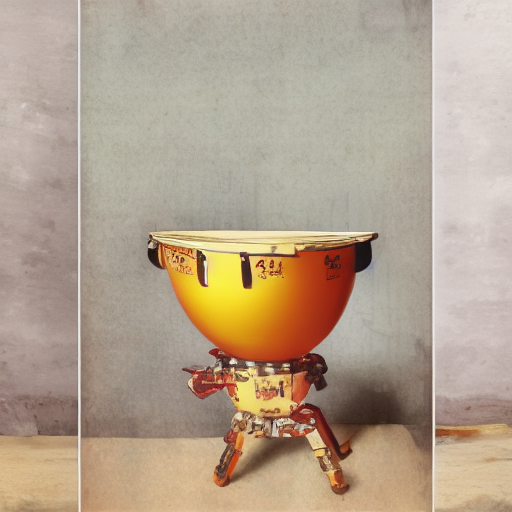

In [140]:
prompt = "Korean instrument Janggu Drum change to Timpani"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

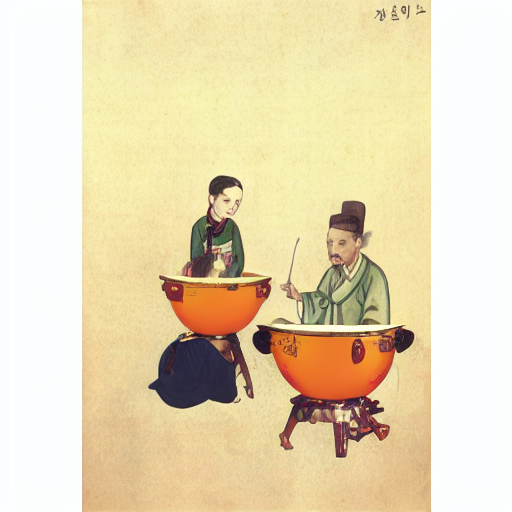

In [141]:
prompt = "Janggu Drum change to Timpani"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

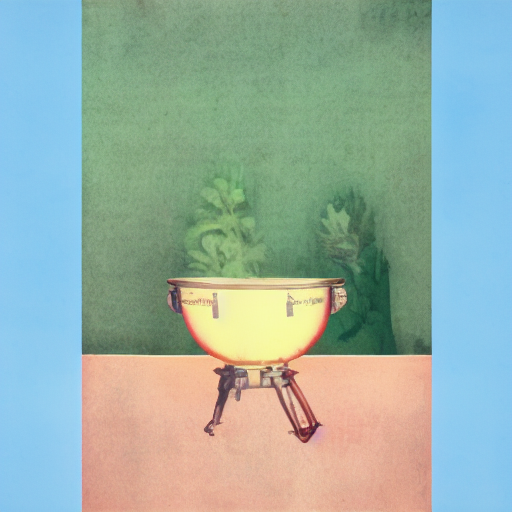

In [142]:
prompt = "Janggu change to Timpani"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

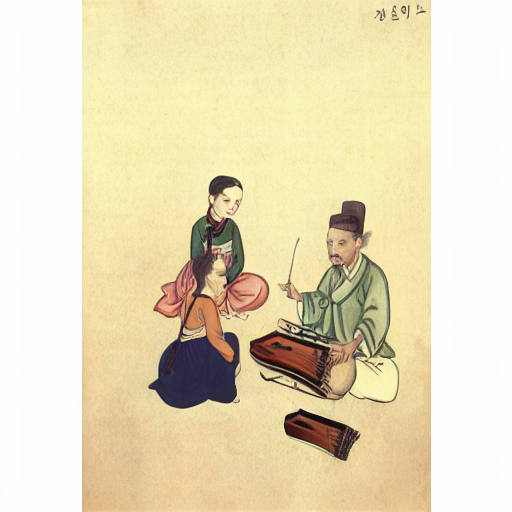

In [143]:
prompt = "change Yanggeum Zither to Zither"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

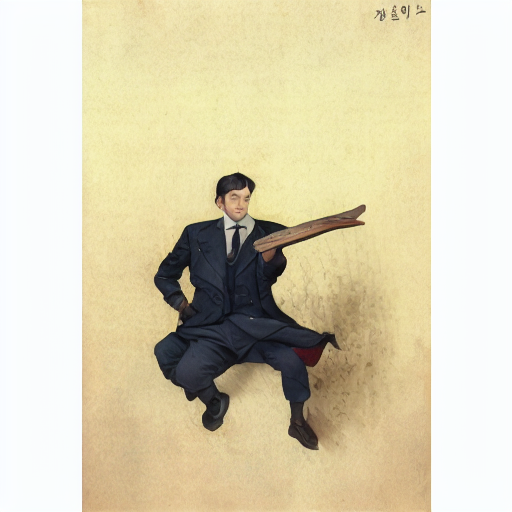

In [151]:
prompt = "change Yanggeumto Zither"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

  0%|          | 0/100 [00:00<?, ?it/s]

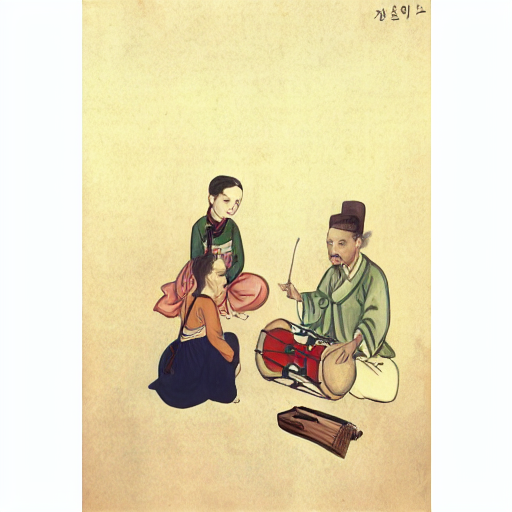

In [152]:
prompt = "Yanggeum to Zither"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

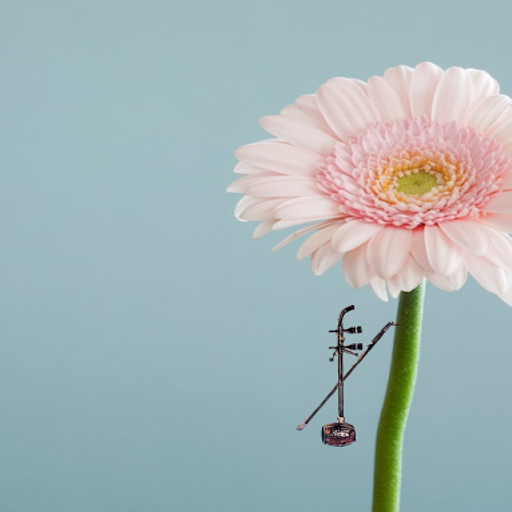

In [153]:
image = process_image_with_padding('test1.png')
image

  0%|          | 0/100 [00:00<?, ?it/s]

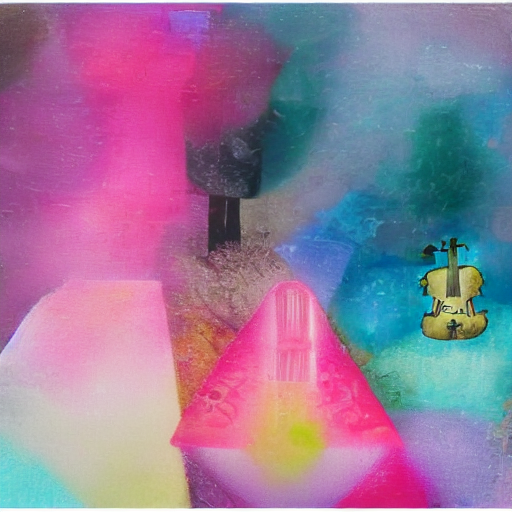

In [154]:
prompt = "change Haegeum Fiddle to Violin"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

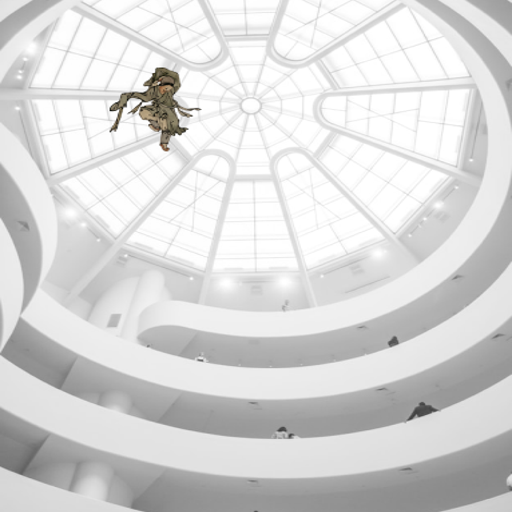

In [155]:
image = process_image_with_padding('test2.png')
image

  0%|          | 0/100 [00:00<?, ?it/s]

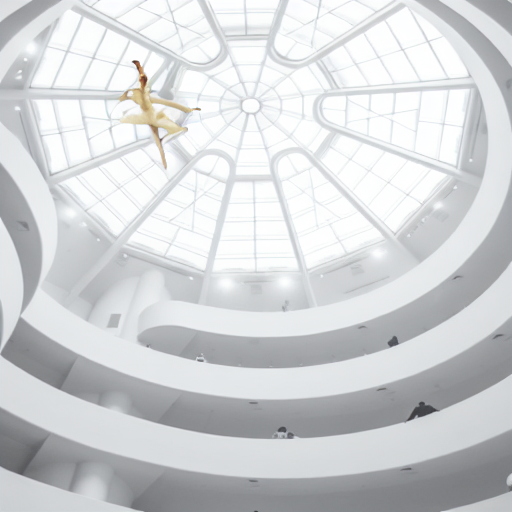

In [156]:
prompt = "change Dongnaehakchum to Ballet"
num_inference_steps = 100
image_guidance_scale = 1.5
guidance_scale = 3

edited_image = pipe(prompt,
   image=image,
   num_inference_steps=num_inference_steps,
   image_guidance_scale=image_guidance_scale,
   guidance_scale=guidance_scale,
   generator=generator,
).images[0]
edited_image.save("edited_image.png")
edited_image

read: Connection reset by peer


In [ ]:
# 복사만 남았다면?
# # 작업 코드
# !cp -r /content/logsss /content/ftp_drive/

# # 작업 완료 후 런타임 종료
# import time
# time.sleep(5)  # 잠깐 대기 후 종료(옵션)
# print("작업이 완료되었습니다. 런타임을 종료합니다.")
# exit()  # Colab 런타임 종료
